<a href="https://colab.research.google.com/github/hiroalchem/data_science_lecture/blob/main/training.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# データサイエンス講義第二回
これはデータサイエンス講義第二回用スクリプトです
Colaboratoryのハードウェア アクセラレータ設定をGPUにして実行してください
上のランタイムタブからランタイムのタイプを変更を選択してください

このスクリプトではtensorflow公式の object detection api リポジトリ (https://github.com/tensorflow/models/tree/master/research/object_detection) をクローンし   
環境を構築して自前の画像とアノテーションを用いてモデルを学習させてみます

ランタイムを実行していると左のフォルダマークのところを選択後
google driveのマークのついたボタンを選択してgoogle driveをマウントしてください

In [1]:
# lectureのディレクトリに移動します
%cd /content/drive/MyDrive/lecture2020

/content/drive/MyDrive/lecture2020


In [2]:
!nvidia-smi

Tue Dec  1 08:19:25 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.38       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
import os
import pathlib

In [4]:
# 必要なライブラリをインストールします
!pip install pycocotools
!pip install tf_slim
!pip install lvis
!pip install tensorflow==2.2

     |████████████████████████████████| 358kB 13.6MB/s 
     |████████████████████████████████| 516.2MB 31kB/s 
     |████████████████████████████████| 3.0MB 30kB/s 
     |████████████████████████████████| 460kB 52.0MB/s 
  Found existing installation: tensorboard 2.3.0
    Uninstalling tensorboard-2.3.0:
      Successfully uninstalled tensorboard-2.3.0
  Found existing installation: tensorflow-estimator 2.3.0
    Uninstalling tensorflow-estimator-2.3.0:
      Successfully uninstalled tensorflow-estimator-2.3.0
  Found existing installation: tensorflow 2.3.0
    Uninstalling tensorflow-2.3.0:
      Successfully uninstalled tensorflow-2.3.0


In [5]:
!rm -r -f /content/drive/MyDrive/lecture2020/models
# tensorflow のリポジトリをクローンしていなければ https://github.com/tensorflow/models をクローンします

if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 2318, done.
remote: Counting objects: 100% (2318/2318), done.
remote: Compressing objects: 100% (2016/2016), done.
remote: Total 2318 (delta 564), reused 926 (delta 278), pack-reused 0
Receiving objects: 100% (2318/2318), 30.64 MiB | 15.93 MiB/s, done.
Resolving deltas: 100% (564/564), done.
Checking out files: 100% (2165/2165), done.


In [6]:
# 必要なものをインストールします
# 少し時間がかかります
%%bash
cd /content/drive/MyDrive/lecture2020/models/research
protoc object_detection/protos/*.proto --python_out=.
pip install .

Processing /content/drive/MyDrive/lecture2020/models/research
  Created wheel for object-detection: filename=object_detection-0.1-cp36-none-any.whl size=1370070 sha256=cd77b89a2a90d3d79813d3aba672b621e948b983d554007d2f53b806fb7d1025
  Stored in directory: /tmp/pip-ephem-wheel-cache-trbnikdi/wheels/d3/e5/d8/a0ccb834fbf73ce1aac5cd232242e48dbdd8a11015e7c6d136
Successfully built object-detection


In [7]:
# install できたか確認
%cd /content/drive/MyDrive/lecture2020/models/research
%set_env PYTHONPATH=/content/drive/MyDrive/lecture2020/models/research:/content/drive/MyDrive/lecture2020/models/research/slim
os.environ['PYTHONPATH'] += ":/content/drive/MyDrive/lecture2020/models"
import sys
sys.path.append("/content/drive/MyDrive/lecture2020/models")
!python ./object_detection/builders/model_builder_tf2_test.py
%cd /content/drive/MyDrive/lecture2020

/content/drive/MyDrive/lecture2020/models/research
env: PYTHONPATH=/content/drive/MyDrive/lecture2020/models/research:/content/drive/MyDrive/lecture2020/models/research/slim
Running tests under Python 3.6.9: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model
2020-12-01 08:23:41.390704: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-12-01 08:23:41.435488: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-12-01 08:23:41.436046: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1561] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla P100-PCIE-16GB computeCapability: 6.0
coreClock: 1.3285GHz coreCount: 56 deviceMemorySize: 15.90GiB deviceMemoryBandwidth: 681.88GiB/s
2020-12-01 08:23:41.436322: I tensorflow/stream_executor/platfor

In [8]:
# 必要なディレクトリを作成します
import os
os.makedirs('./trial1', exist_ok=True)
%cd ./trial1
os.makedirs('./annotations', exist_ok=True)
os.makedirs('./images', exist_ok=True)
os.makedirs('./images/train', exist_ok=True)
os.makedirs('./images/val', exist_ok=True)
os.makedirs('./pre_trained_models', exist_ok=True)

/content/drive/My Drive/lecture2020/trial1


In [9]:
# label_map.pbtxtを作成する必要があるので、雛形をコピーしておきます
!cp ../models/research/object_detection/data/pet_label_map.pbtxt annotations/label_map.pbtxt

In [ ]:
# つけたアノテーションの数分のitemを残して残りを削除
# アノテーションでつけた名前にnameを変更
# 例えば全ての細胞に cell という名前をつけた場合は以下の様に変更
# item {
#   id: 1
#   name: 'cell'
# }

In [10]:
# COCOで学習済みのFasterRCNNを使用するのでモデルをダウンロードします
os.makedirs('./downloads', exist_ok=True)
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_800x1333_coco17_gpu-8.tar.gz -P ./downloads
!tar zxvf ./downloads/faster_rcnn_resnet50_v1_800x1333_coco17_gpu-8.tar.gz -C ./pre_trained_models

--2020-12-01 08:32:15--  http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_800x1333_coco17_gpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.128.128, 2a00:1450:4013:c02::80
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.128.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 217477056 (207M) [application/x-tar]
Saving to: ‘./downloads/faster_rcnn_resnet50_v1_800x1333_coco17_gpu-8.tar.gz’

faster_rcnn_resnet5 100%[===================>] 207.40M  81.6MB/s    in 2.5s    

2020-12-01 08:32:18 (81.6 MB/s) - ‘./downloads/faster_rcnn_resnet50_v1_800x1333_coco17_gpu-8.tar.gz’ saved [217477056/217477056]

faster_rcnn_resnet50_v1_800x1333_coco17_gpu-8/
faster_rcnn_resnet50_v1_800x1333_coco17_gpu-8/checkpoint/
faster_rcnn_resnet50_v1_800x1333_coco17_gpu-8/checkpoint/ckpt-0.data-00000-of-00001
faster_rcnn_resnet50_v1_800x1333_coco17_gpu-8/checkpoint/checkpoint
faster_rcnn_resn

In [11]:
# アノテーション (xmlファイル) をTFRecordという形式に変換するための関数を読み込みます
import os
import sys
import glob
import pandas as pd
import io
import xml.etree.ElementTree as ET
import argparse

sys.path.append('../models/research')

import tensorflow.compat.v1 as tf
from PIL import Image
from object_detection.utils import dataset_util, label_map_util
from collections import namedtuple


def xml_to_csv(path):
    xml_list = []
    for xml_file in glob.glob(path + '/*.xml'):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        for member in root.findall('object'):
            value = (root.find('filename').text,
                     int(root.find('size')[0].text),
                     int(root.find('size')[1].text),
                     member[0].text,
                     int(member[4][0].text),
                     int(member[4][1].text),
                     int(member[4][2].text),
                     int(member[4][3].text)
                     )
            xml_list.append(value)
    column_name = ['filename', 'width', 'height',
                   'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df


def class_text_to_int(row_label):
    return label_map_dict[row_label]


def split(df, group):
    data = namedtuple('data', ['filename', 'object'])
    gb = df.groupby(group)
    return [data(filename, gb.get_group(x)) for filename, x in zip(gb.groups.keys(), gb.groups)]


def create_tf_example(group, path):
    with tf.gfile.GFile(os.path.join(path, '{}'.format(group.filename)), 'rb') as fid:
        encoded_jpg = fid.read()
    encoded_jpg_io = io.BytesIO(encoded_jpg)
    image = Image.open(encoded_jpg_io)
    width, height = image.size

    filename = group.filename.encode('utf8')
    image_format = b'jpg'
    xmins = []
    xmaxs = []
    ymins = []
    ymaxs = []
    classes_text = []
    classes = []

    for index, row in group.object.iterrows():
        xmins.append(row['xmin'] / width)
        xmaxs.append(row['xmax'] / width)
        ymins.append(row['ymin'] / height)
        ymaxs.append(row['ymax'] / height)
        classes_text.append(row['class'].encode('utf8'))
        classes.append(class_text_to_int(row['class']))

    tf_example = tf.train.Example(features=tf.train.Features(feature={
        'image/height': dataset_util.int64_feature(height),
        'image/width': dataset_util.int64_feature(width),
        'image/filename': dataset_util.bytes_feature(filename),
        'image/source_id': dataset_util.bytes_feature(filename),
        'image/encoded': dataset_util.bytes_feature(encoded_jpg),
        'image/format': dataset_util.bytes_feature(image_format),
        'image/object/bbox/xmin': dataset_util.float_list_feature(xmins),
        'image/object/bbox/xmax': dataset_util.float_list_feature(xmaxs),
        'image/object/bbox/ymin': dataset_util.float_list_feature(ymins),
        'image/object/bbox/ymax': dataset_util.float_list_feature(ymaxs),
        'image/object/class/text': dataset_util.bytes_list_feature(classes_text),
        'image/object/class/label': dataset_util.int64_list_feature(classes),
    }))
    return tf_example

def create_TF(output_path, data_dir):
    writer = tf.python_io.TFRecordWriter(output_path)
    examples = xml_to_csv(data_dir)
    grouped = split(examples, 'filename')
    for group in grouped:
        tf_example = create_tf_example(group, data_dir)
        writer.write(tf_example.SerializeToString())
    writer.close()
    print(f'Successfully created the TFRecord file: {output_path}')


In [12]:
# label_map.pbtxtを読み込みます
label_map = label_map_util.load_labelmap('./annotations/label_map.pbtxt')
label_map_dict = label_map_util.get_label_map_dict(label_map)

In [13]:
# labelを確認しましょう
print(label_map_dict)

{'cell': 1, 'micro': 2}


In [ ]:
# './images/train' ディレクトリに学習用の画像とxmlファイルを
# './images/val' ディレクトリにvalidation用の画像とxmlファイルをおいてください

In [14]:
# 学習用のアノテーションをTFRecordに変換
create_TF('./annotations/train.record', './images/train')

Successfully created the TFRecord file: ./annotations/train.record


In [15]:
# validation用のアノテーションをTFRecordに変換
create_TF('./annotations/val.record', './images/val')

Successfully created the TFRecord file: ./annotations/val.record


In [16]:
!cp ./pre_trained_models/faster_rcnn_resnet50_v1_800x1333_coco17_gpu-8/pipeline.config ./mypipeline.config

In [ ]:

# 3行目 クラス数を自分でつけたラベルの種類の数に変更します : 90 → 2
# 11行目 min_dimension : 800 → 200
# 12行目 max_dimension : 1333 → 600
# 84行目 batch_size (一度に学習する画像枚数を減らします) : 16 → 4
# 85行目 学習ステップ数を減らします : 200000 → 2000
# 91行目 学習ステップ数を減らします : 200000 → 2000
# 93行目 学習ステップ数に合わせて2桁削っておく : 5000 → 50
# 102行目 学習済みモデルのpath : PATH_TO_BE_CONFIGURED → /content/drive/MyDrive/lecture2020/trial1/pre_trained_models/faster_rcnn_resnet50_v1_800x1333_coco17_gpu-8/checkpoint/ckpt-0
# 103行目 検出モデルを作るので変更 : classification → detection
# 132行目 それぞれpathを変更 : PATH_TO_BE_CONFIGURED/label_map.txt → /content/drive/MyDrive/lecture2020/trial1/annotations/label_map.pbtxt
# 134行目 それぞれpathを変更 : PATH_TO_BE_CONFIGURED/train2017-?????-of-00256.tfrecord → /content/drive/MyDrive/lecture2020/trial1/annotations/train.record
# 145行目 それぞれpathを変更 : PATH_TO_BE_CONFIGURED/label_map.txt → /content/drive/MyDrive/lecture2020/trial1/annotations/label_map.pbtxt
# 149行目 それぞれpathを変更 : PATH_TO_BE_CONFIGURED/val2017-?????-of-00032.tfrecord → /content/drive/MyDrive/lecture2020/trial1/annotations/val.record

In [20]:
# tensorboardの準備
%load_ext tensorboard

In [21]:
# tensorboardをここに表示します
# tensorboardでは学習時の loss の変動を見ることなどができ、学習の進捗を確認できます
os.makedirs('./models', exist_ok=True)
%tensorboard --logdir=/content/drive/MyDrive/lecture2020/trial1/models/faster_rcnn_resnet50_v1_800x1333_coco17_gpu-8

<IPython.core.display.Javascript object>

In [22]:
# 学習を開始しましょう
# 開始したらtensorboardを確認しましょう
# しばらくすると表示が変わります
%cd /content/drive/MyDrive/lecture2020/models/research
!python object_detection/model_main_tf2.py \
    --pipeline_config_path="/content/drive/MyDrive/lecture2020/trial1/mypipeline.config" \
    --model_dir="/content/drive/MyDrive/lecture2020/trial1/models/faster_rcnn_resnet50_v1_800x1333_coco17_gpu-8" \
    --alsologtostderr 

/content/drive/MyDrive/lecture2020/models/research
2020-12-01 09:05:15.924451: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-12-01 09:05:15.940209: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-12-01 09:05:15.941188: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1561] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla P100-PCIE-16GB computeCapability: 6.0
coreClock: 1.3285GHz coreCount: 56 deviceMemorySize: 15.90GiB deviceMemoryBandwidth: 681.88GiB/s
2020-12-01 09:05:15.941655: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
2020-12-01 09:05:15.944306: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10
2020-12-01

In [23]:
# 学習が終わったら学習したモデルをexportします
!python object_detection/exporter_main_v2.py \
    --input_type=image_tensor \
    --pipeline_config_path="/content/drive/MyDrive/lecture2020/trial1/mypipeline.config" \
    --trained_checkpoint_dir="/content/drive/MyDrive/lecture2020/trial1/models/faster_rcnn_resnet50_v1_800x1333_coco17_gpu-8" \
    --output_directory="/content/drive/MyDrive/lecture2020/trial1/models/faster_rcnn_resnet50_v1_800x1333_coco17_gpu-8/exported"

2020-12-01 09:25:58.679630: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-12-01 09:25:58.698125: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-12-01 09:25:58.698744: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1561] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla P100-PCIE-16GB computeCapability: 6.0
coreClock: 1.3285GHz coreCount: 56 deviceMemorySize: 15.90GiB deviceMemoryBandwidth: 681.88GiB/s
2020-12-01 09:25:58.699063: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
2020-12-01 09:25:58.701887: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10
2020-12-01 09:25:58.704280: I tensorflow/stream_executor/plat

In [24]:
# exportしたモデルを読み込んでみましょう
model_path = '/content/drive/MyDrive/lecture2020/trial1/models/faster_rcnn_resnet50_v1_800x1333_coco17_gpu-8/exported/saved_model'

import tensorflow as tf
import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
print('Loading model...', end='')
# Load saved model and build the detection function
detect_fn=tf.saved_model.load(model_path)
print('Done!')

Loading model...Done!


In [25]:
# label_map.pbtxtを読み込みます
#Loading the label_map
category_index=label_map_util.create_category_index_from_labelmap("/content/drive/MyDrive/lecture2020/trial1/annotations/label_map.pbtxt",use_display_name=True)


In [26]:
# test用画像を読み込みます
test_dir = pathlib.Path('/content/drive/MyDrive/lecture2020/trial1_images/test')
test_imgs = sorted(list(test_dir.glob('./*.png')))
print(test_imgs)

[PosixPath('/content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_C19_s4_w1AD3DC23E-B9B5-46E9-9716-26096C672A13_0.png'), PosixPath('/content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_C19_s4_w1AD3DC23E-B9B5-46E9-9716-26096C672A13_1.png'), PosixPath('/content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_C19_s4_w1AD3DC23E-B9B5-46E9-9716-26096C672A13_2.png'), PosixPath('/content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_C19_s4_w1AD3DC23E-B9B5-46E9-9716-26096C672A13_3.png'), PosixPath('/content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_G01_s2_w1FBE52723-8BDF-4346-89BB-216A4A69ED1C_0.png'), PosixPath('/content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_G01_s2_w1FBE52723-8BDF-4346-89BB-216A4A69ED1C_1.png'), PosixPath('/content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_G01_s2_w1FBE52723-8BDF-4346-89BB-216A4A69ED1C_2.png'), PosixPath('/content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_G01_s2_w1FBE52723-8BDF-4346-89

In [27]:
# 必要なライブラリ
%matplotlib inline
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# 画像の読み込み用関数
def load_image_into_numpy_array(path):
    img = Image.open(path)
    if img.mode != "RGB":
      img = img.convert("RGB")
    return np.array(img)

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_C19_s4_w1AD3DC23E-B9B5-46E9-9716-26096C672A13_0.png... Done


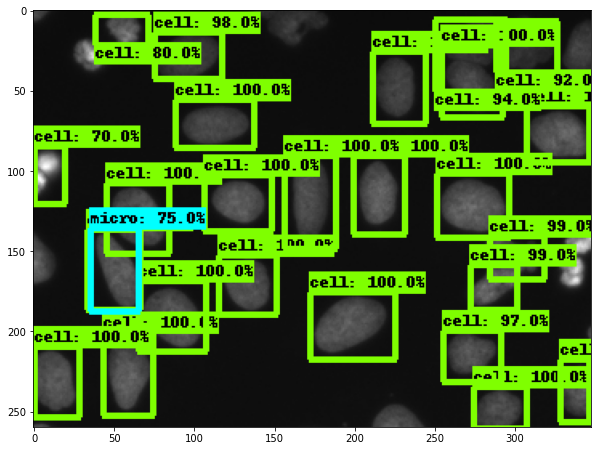

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_C19_s4_w1AD3DC23E-B9B5-46E9-9716-26096C672A13_1.png... Done


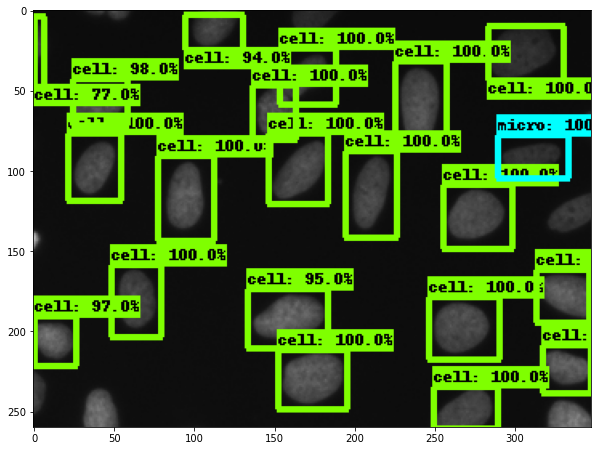

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_C19_s4_w1AD3DC23E-B9B5-46E9-9716-26096C672A13_2.png... Done


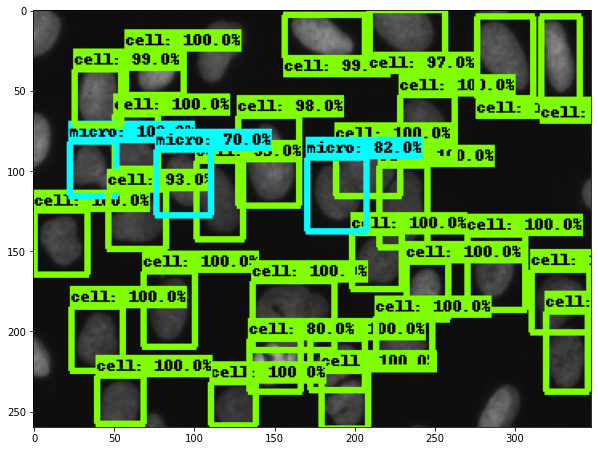

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_C19_s4_w1AD3DC23E-B9B5-46E9-9716-26096C672A13_3.png... Done


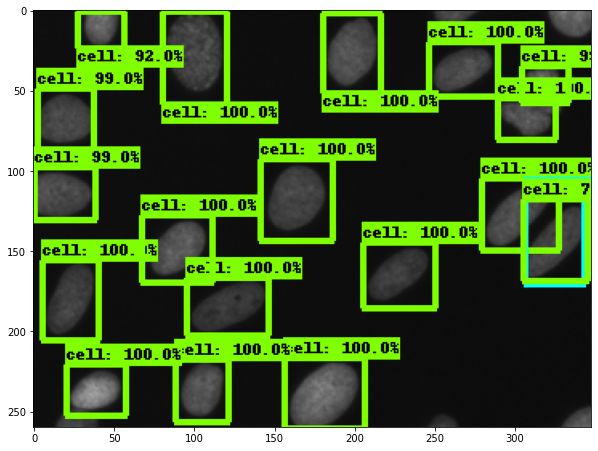

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_G01_s2_w1FBE52723-8BDF-4346-89BB-216A4A69ED1C_0.png... Done


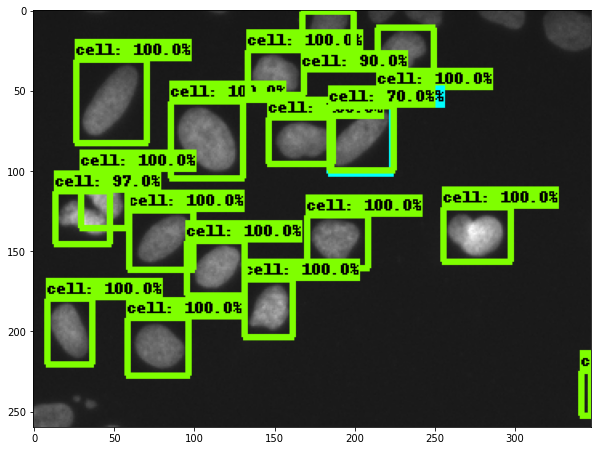

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_G01_s2_w1FBE52723-8BDF-4346-89BB-216A4A69ED1C_1.png... Done


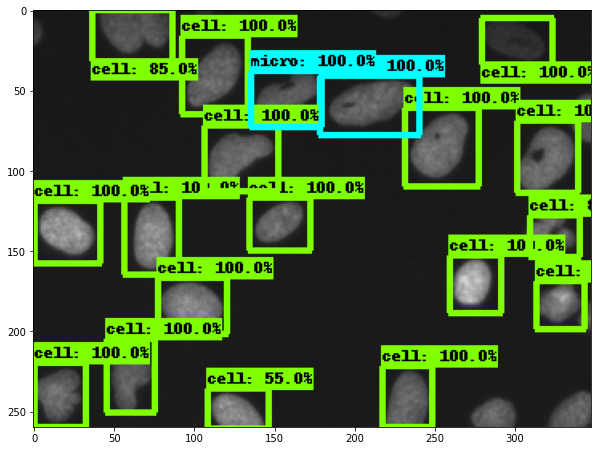

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_G01_s2_w1FBE52723-8BDF-4346-89BB-216A4A69ED1C_2.png... Done


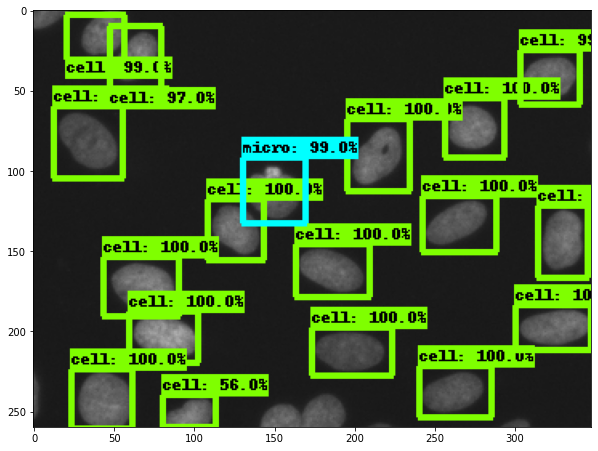

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_G01_s2_w1FBE52723-8BDF-4346-89BB-216A4A69ED1C_3.png... Done


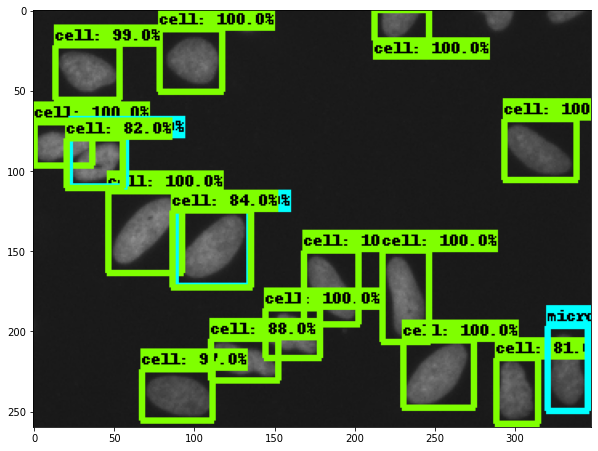

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_G12_s6_w16850371E-A405-4D73-9816-F5F68F885D38_0.png... Done


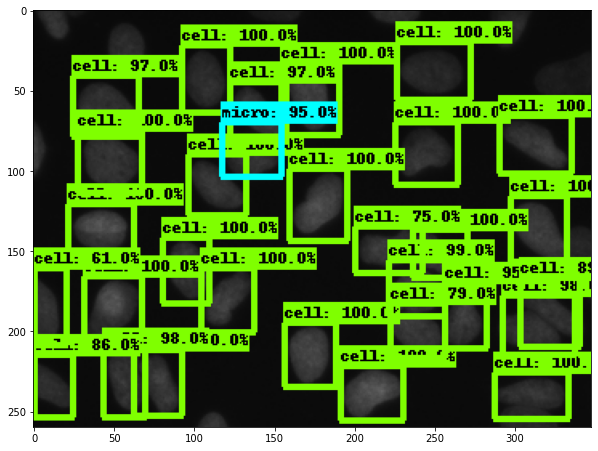

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_G12_s6_w16850371E-A405-4D73-9816-F5F68F885D38_1.png... Done


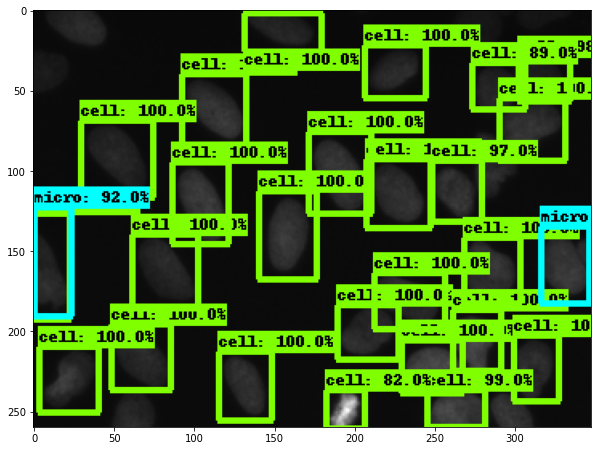

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_G12_s6_w16850371E-A405-4D73-9816-F5F68F885D38_2.png... Done


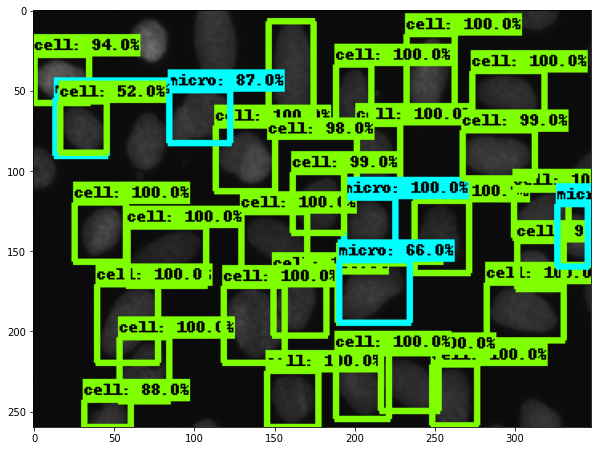

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_G12_s6_w16850371E-A405-4D73-9816-F5F68F885D38_3.png... Done


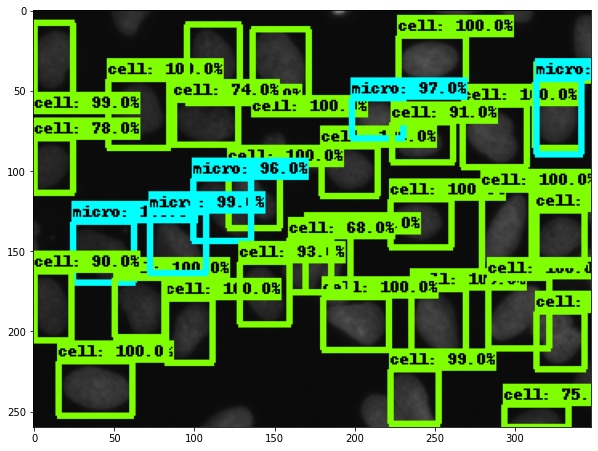

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_J02_s8_w1D9C198F9-ECF0-4EF7-848D-AC7782CD3C28_0.png... Done


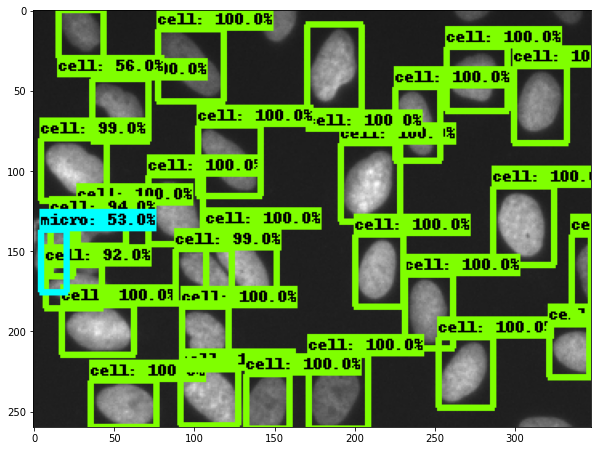

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_J02_s8_w1D9C198F9-ECF0-4EF7-848D-AC7782CD3C28_1.png... Done


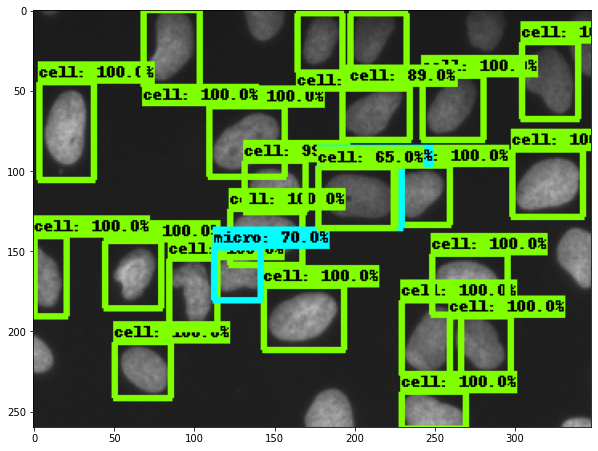

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_J02_s8_w1D9C198F9-ECF0-4EF7-848D-AC7782CD3C28_2.png... Done


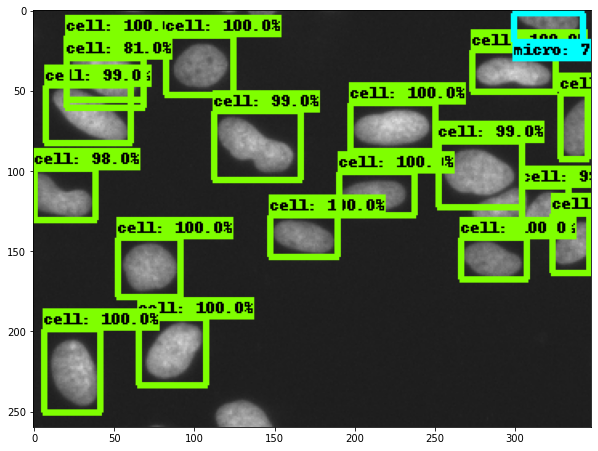

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_J02_s8_w1D9C198F9-ECF0-4EF7-848D-AC7782CD3C28_3.png... Done


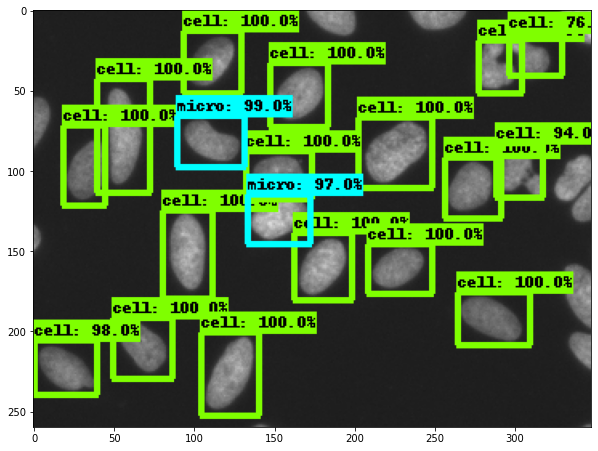

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_N18_s2_w1CC5ED51D-86C5-437D-8EDD-E56E4C949B3B_0.png... Done


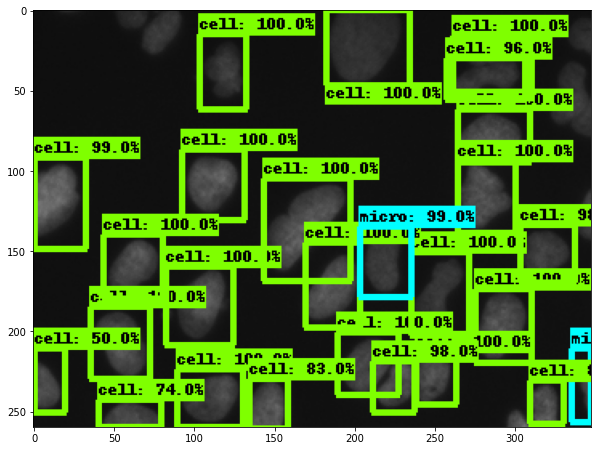

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_N18_s2_w1CC5ED51D-86C5-437D-8EDD-E56E4C949B3B_1.png... Done


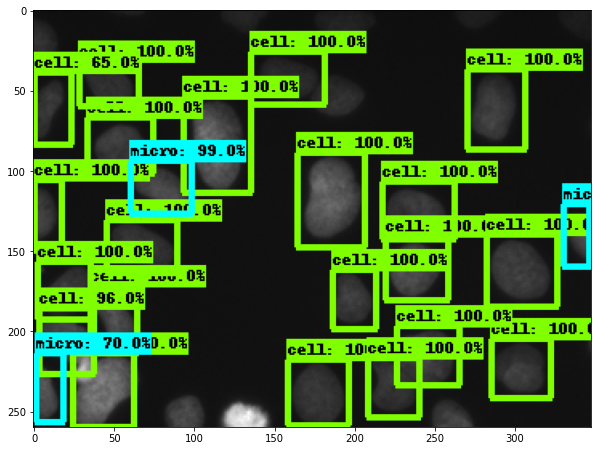

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_N18_s2_w1CC5ED51D-86C5-437D-8EDD-E56E4C949B3B_2.png... Done


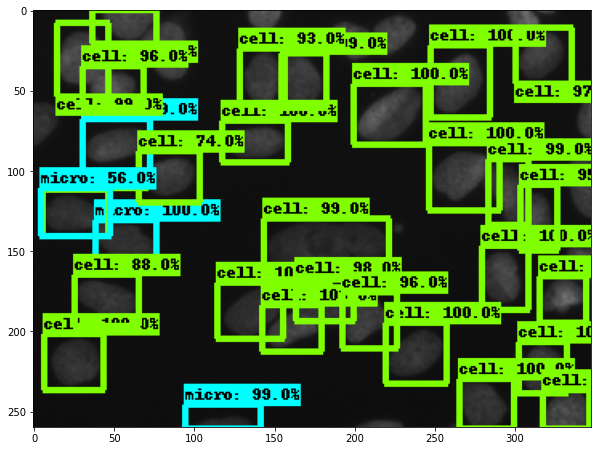

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_N18_s2_w1CC5ED51D-86C5-437D-8EDD-E56E4C949B3B_3.png... Done


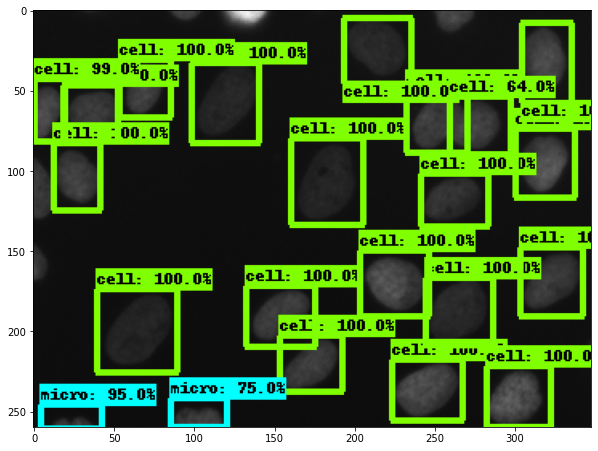

In [28]:
# 検出してみましょう

for image_path in test_imgs:
    image_path = str(image_path)
    print('Running inference for {}... '.format(image_path), end='')
    image_np=load_image_into_numpy_array(image_path)
    input_tensor=tf.convert_to_tensor(image_np)
    input_tensor=input_tensor[tf.newaxis, ...]
    detections=detect_fn(input_tensor)
    num_detections=int(detections.pop('num_detections'))
    detections={key:value[0,:num_detections].numpy() for key,value in detections.items()}
    detections['num_detections']=num_detections
    detections['detection_classes']=detections['detection_classes'].astype(np.int64)
    image_np_with_detections=image_np.copy()
    viz_utils.visualize_boxes_and_labels_on_image_array(
          image_np_with_detections,
          detections['detection_boxes'],
          detections['detection_classes'],
          detections['detection_scores'],
          category_index,
          use_normalized_coordinates=True,
          max_boxes_to_draw=100,     
          min_score_thresh=.5,      
          agnostic_mode=False)
    plt.figure(figsize=(10,10))
    plt.imshow(image_np_with_detections)
    print('Done')
    plt.show()

In [29]:
# 複数のクラスがある場合、1つの物体に複数の検出結果が出てしまうので、よりscoreの高いものだけを残すように変更
# 検出結果をxmlファイルで出力

import cv2
import logging
import xml.etree.ElementTree as ET

from object_detection.utils import np_box_list, np_box_list_ops


def indent(elem, level=0):
    i = "\n" + level*"  "
    if len(elem):
        if not elem.text or not elem.text.strip():
            elem.text = i + "  "
        if not elem.tail or not elem.tail.strip():
            elem.tail = i
        for elem in elem:
            indent(elem, level+1)
        if not elem.tail or not elem.tail.strip():
            elem.tail = i
    else:
        if level and (not elem.tail or not elem.tail.strip()):
            elem.tail = i

            
def create_annotation(pred_boxes, pred_scores, pred_classes, image_path, class_label):
    """
    How to use:
      ...
      (pred_boxes, pred_scores, pred_classes, num_detections) = sess.run(
      [boxes, scores, classes, num_detections_tensor],
      feed_dict={image_tensor: image_np_expanded})
      pred_boxes = pred_boxes[0]
      pred_scores = pred_scores[0]
      pred_classes = pred_classes[0].astype('int')
      tree = create_annotation(pred_boxes, pred_scores, pred_classes, image_path, class_label)
      tree.write(ann_file_name)
    N=num_prediction_boxes, M=num_classes
    :param pred_boxes: (float32 numpy array) size:(N,4)
    :param pred_scores:(float32 numpy array) size:(N,)
    :param pred_classes:(int64 numpy array) size:(N,)
    :param image_path:(str)path to image
    :param class_label:(dictionary){id(int):class_name(str), ...} size:M
    :return:
    """
    image_name = os.path.basename(image_path)
    if not os.path.exists(image_path):
        logging.warning('%s is not found.', image_path)

    image = cv2.imread(image_path, 1)
    img_h, img_w, img_d = image.shape

    # Create annotation file
    root = ET.Element('annotation')
    folder = ET.SubElement(root, 'folder')
    filename = ET.SubElement(root, 'filename')
    path = ET.SubElement(root, 'path')
    folder.text = "dataset"
    filename.text = image_name
    path.text = image_path

    source = ET.SubElement(root, 'source')
    database = ET.SubElement(source, 'database')
    database.text = "Unkonwn"

    size = ET.SubElement(root, 'size')
    width_elm = ET.SubElement(size, 'width')
    height_elm = ET.SubElement(size, 'height')
    depth_elm = ET.SubElement(size, 'depth')
    width_elm.text = str(img_w)
    height_elm.text = str(img_h)
    depth_elm.text = str(img_d)

    segmented = ET.SubElement(root, 'segmented')
    segmented.text = str(0)

    for pos, score, class_id in zip(pred_boxes, pred_scores, pred_classes):
        miny, minx, maxy, maxx = pos
        object_elm = ET.SubElement(root, 'object')
        name_elm = ET.SubElement(object_elm, 'name')
        pose_elm = ET.SubElement(object_elm, 'pose')
        truncated_elm = ET.SubElement(object_elm, 'truncated')
        difficult_elm1 = ET.SubElement(object_elm, 'difficult')
        difficult_elm2 = ET.SubElement(object_elm, 'Difficult')
        name_elm.text = class_label[class_id]
        pose_elm.text = 'Unspecified'
        truncated_elm.text = '0'
        difficult_elm1.text = '0'
        difficult_elm2.text = '0'

        bndbox_elm = ET.SubElement(object_elm, 'bndbox')
        xmin_elm = ET.SubElement(bndbox_elm, 'xmin')
        ymin_elm = ET.SubElement(bndbox_elm, 'ymin')
        xmax_elm = ET.SubElement(bndbox_elm, 'xmax')
        ymax_elm = ET.SubElement(bndbox_elm, 'ymax')
        xmin_elm.text = str(int(minx * img_w))
        ymin_elm.text = str(int(miny * img_h))
        xmax_elm.text = str(int(maxx * img_w))
        ymax_elm.text = str(int(maxy * img_h))

        score_elm = ET.SubElement(object_elm, 'score')
        score_elm.text = '{0:.6f}'.format(score)

    indent(root)
    tree = ET.ElementTree(root)

    return tree



Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_C19_s4_w1AD3DC23E-B9B5-46E9-9716-26096C672A13_0.png... Done


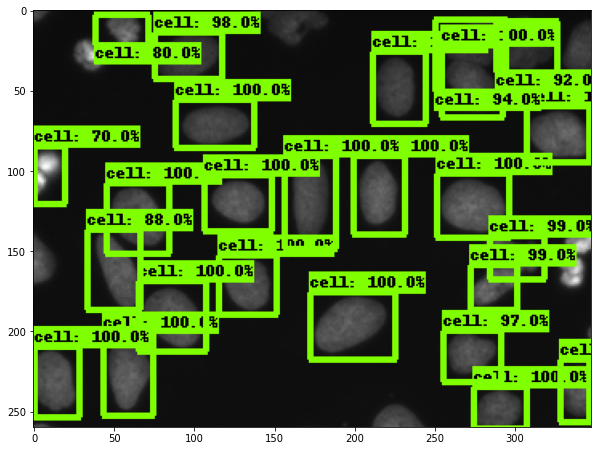

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_C19_s4_w1AD3DC23E-B9B5-46E9-9716-26096C672A13_1.png... Done


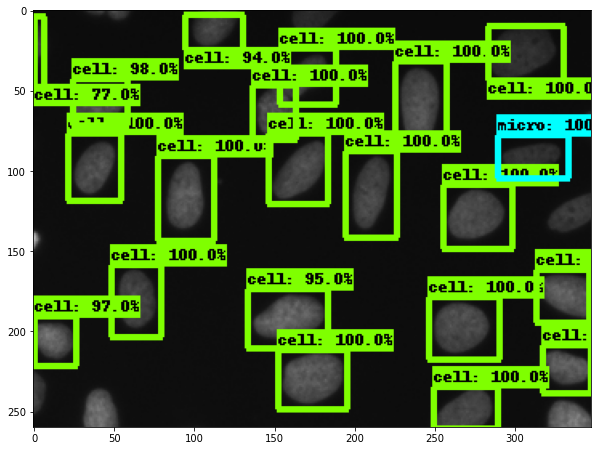

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_C19_s4_w1AD3DC23E-B9B5-46E9-9716-26096C672A13_2.png... Done


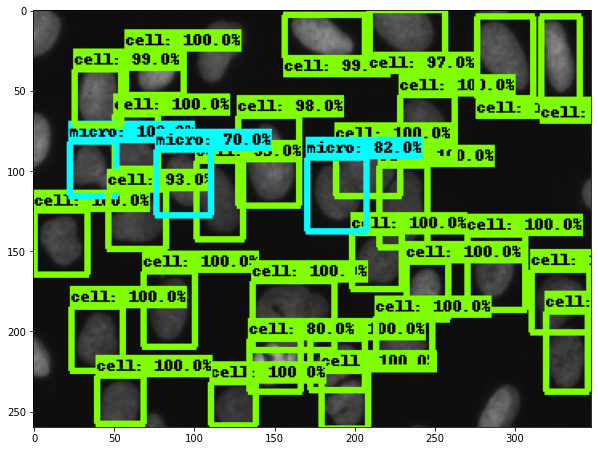

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_C19_s4_w1AD3DC23E-B9B5-46E9-9716-26096C672A13_3.png... Done


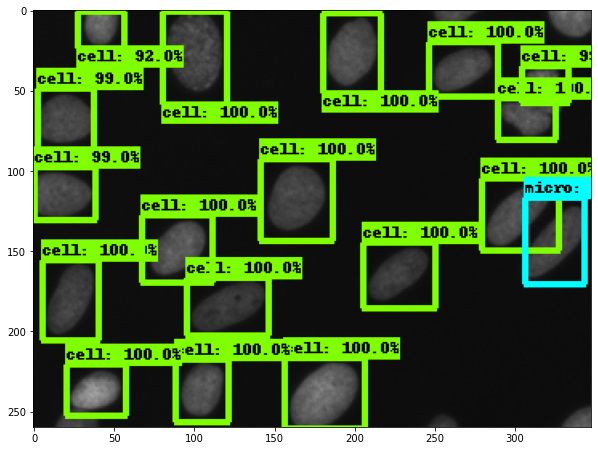

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_G01_s2_w1FBE52723-8BDF-4346-89BB-216A4A69ED1C_0.png... Done


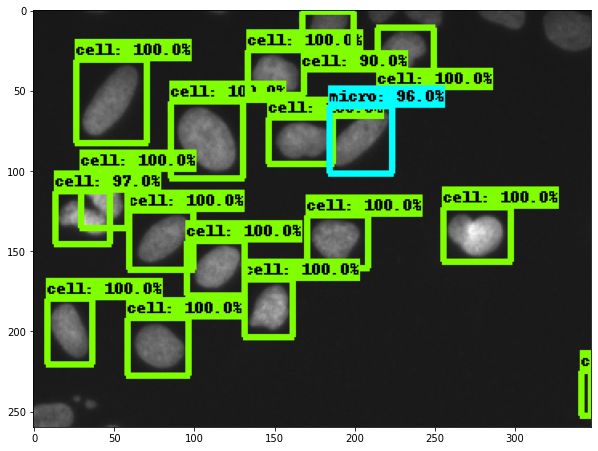

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_G01_s2_w1FBE52723-8BDF-4346-89BB-216A4A69ED1C_1.png... Done


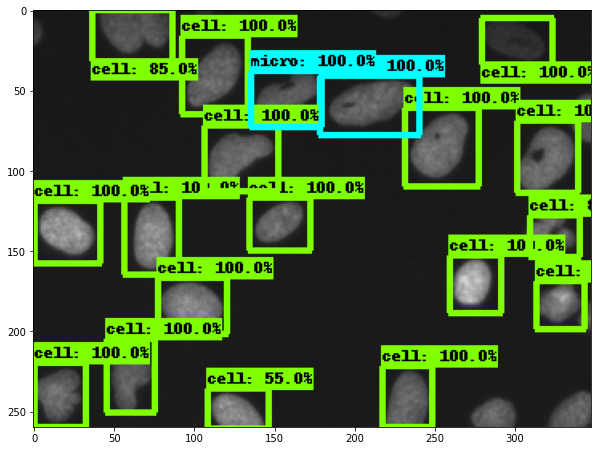

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_G01_s2_w1FBE52723-8BDF-4346-89BB-216A4A69ED1C_2.png... Done


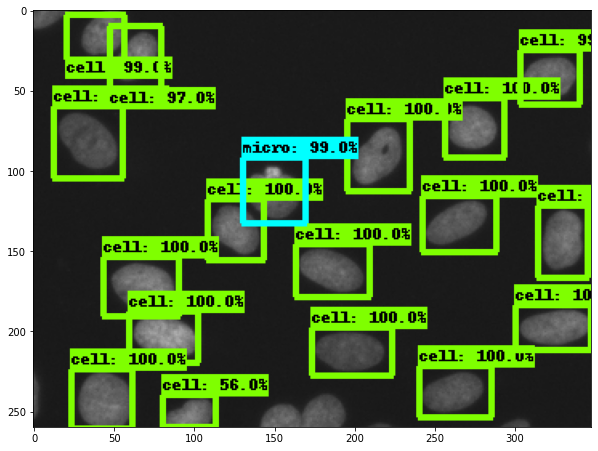

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_G01_s2_w1FBE52723-8BDF-4346-89BB-216A4A69ED1C_3.png... Done


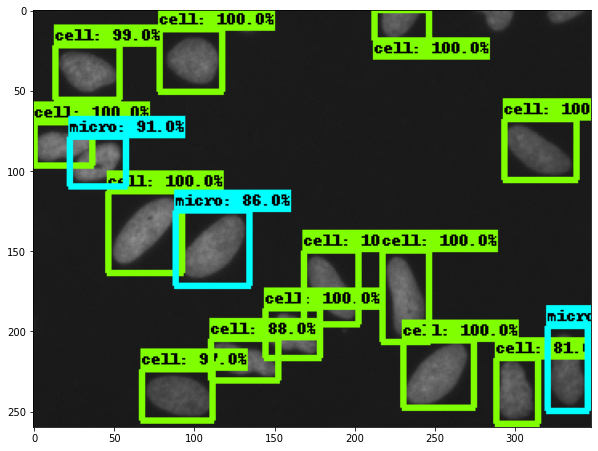

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_G12_s6_w16850371E-A405-4D73-9816-F5F68F885D38_0.png... Done


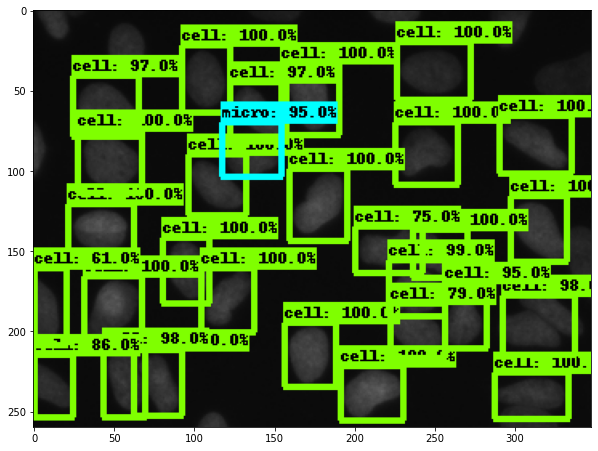

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_G12_s6_w16850371E-A405-4D73-9816-F5F68F885D38_1.png... Done


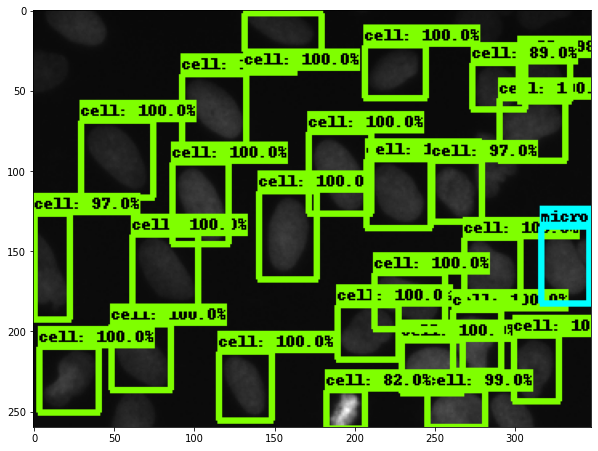

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_G12_s6_w16850371E-A405-4D73-9816-F5F68F885D38_2.png... Done


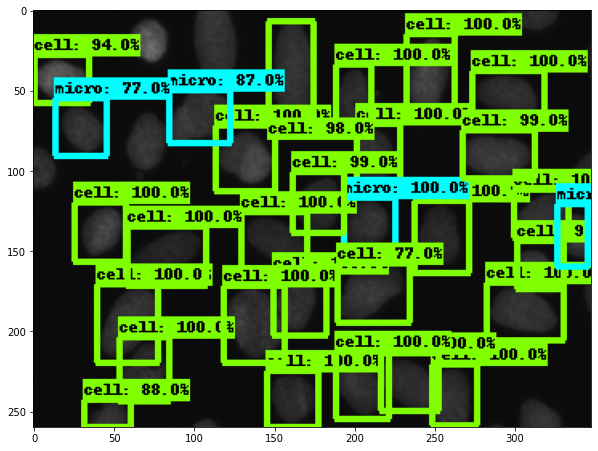

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_G12_s6_w16850371E-A405-4D73-9816-F5F68F885D38_3.png... Done


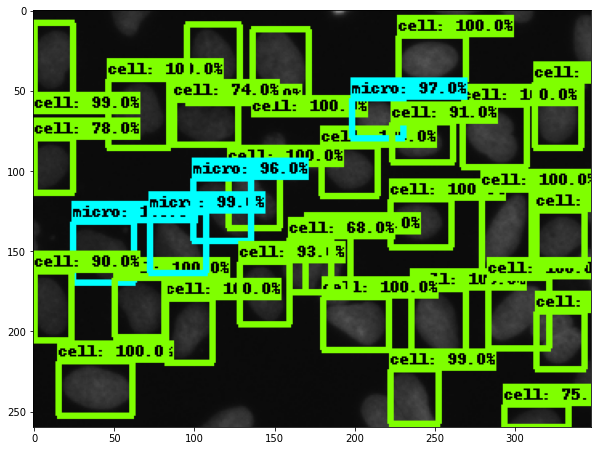

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_J02_s8_w1D9C198F9-ECF0-4EF7-848D-AC7782CD3C28_0.png... Done


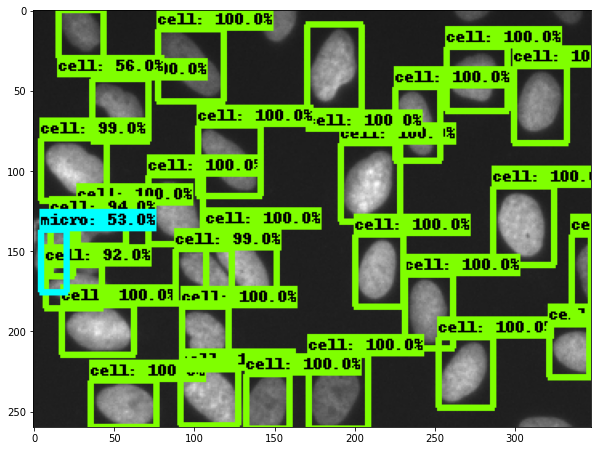

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_J02_s8_w1D9C198F9-ECF0-4EF7-848D-AC7782CD3C28_1.png... Done


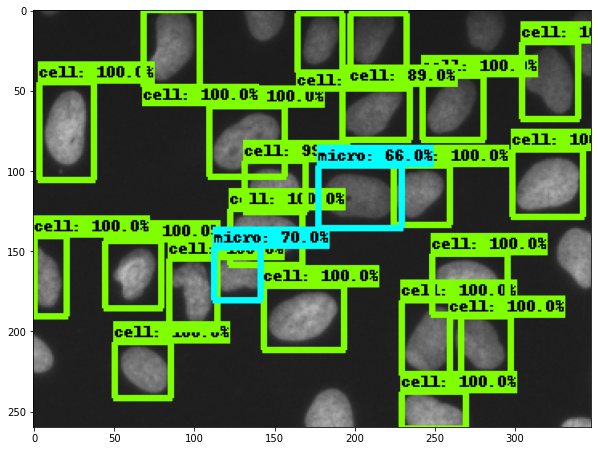

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_J02_s8_w1D9C198F9-ECF0-4EF7-848D-AC7782CD3C28_2.png... Done


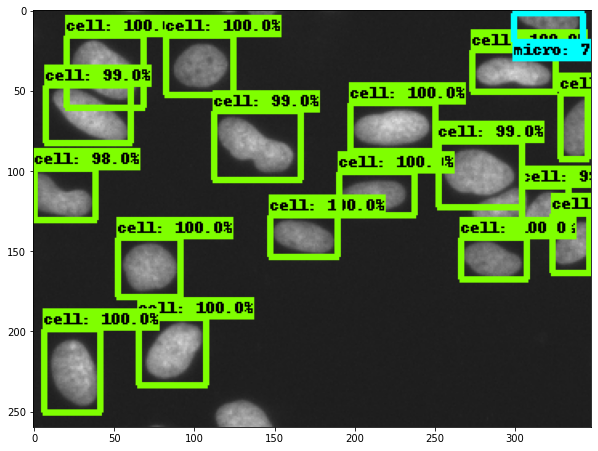

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_J02_s8_w1D9C198F9-ECF0-4EF7-848D-AC7782CD3C28_3.png... Done


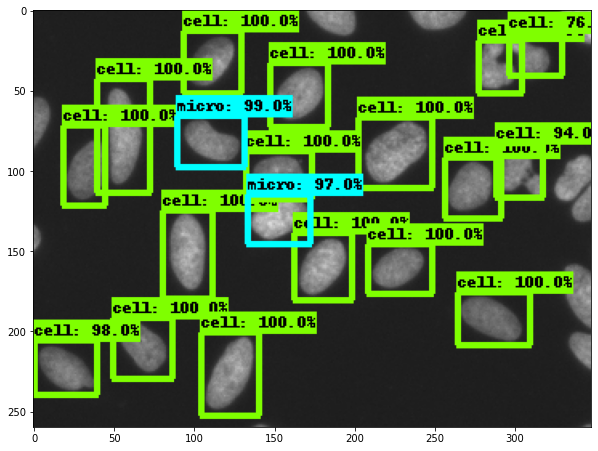

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_N18_s2_w1CC5ED51D-86C5-437D-8EDD-E56E4C949B3B_0.png... Done


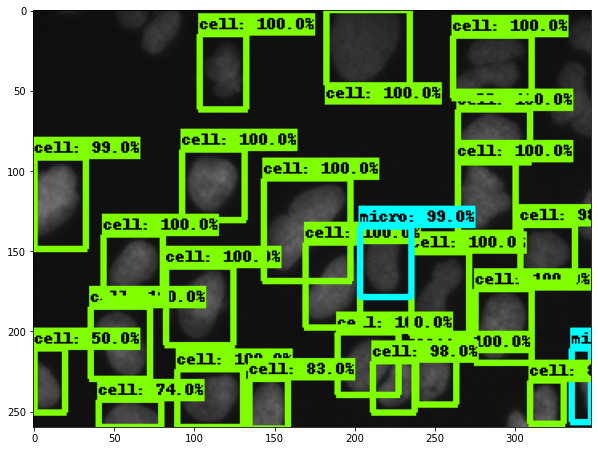

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_N18_s2_w1CC5ED51D-86C5-437D-8EDD-E56E4C949B3B_1.png... Done


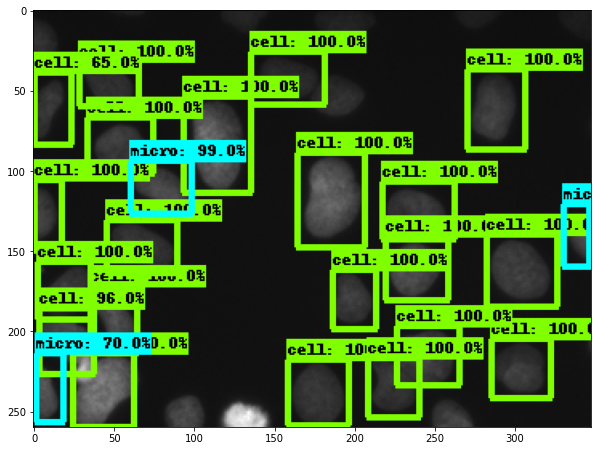

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_N18_s2_w1CC5ED51D-86C5-437D-8EDD-E56E4C949B3B_2.png... Done


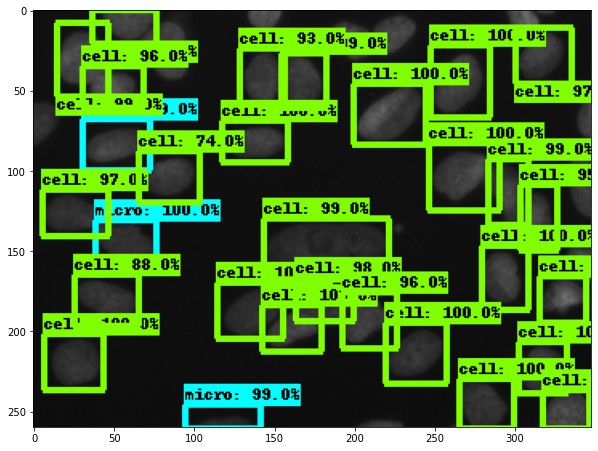

Running inference for /content/drive/MyDrive/lecture2020/trial1_images/test/IXMtest_N18_s2_w1CC5ED51D-86C5-437D-8EDD-E56E4C949B3B_3.png... Done


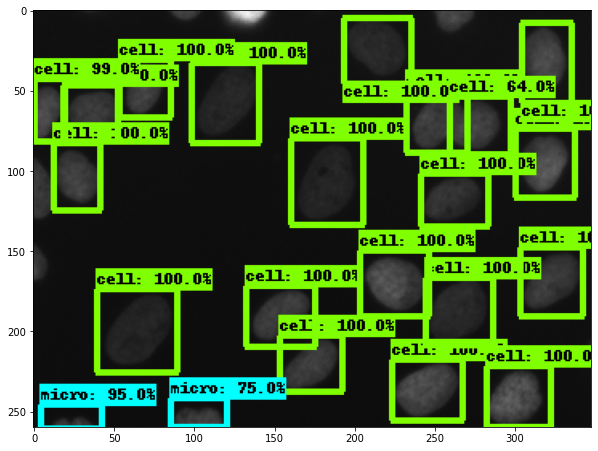

In [30]:
output_dir = '/content/drive/MyDrive/lecture2020/trial1/output_xml'
os.makedirs(output_dir, exist_ok=True)

for image_path in test_imgs:
    image_path = str(image_path)
    print('Running inference for {}... '.format(image_path), end='')
    image_np=load_image_into_numpy_array(image_path)
    input_tensor=tf.convert_to_tensor(image_np)
    input_tensor=input_tensor[tf.newaxis, ...]
    detections=detect_fn(input_tensor)
    num_detections=int(detections.pop('num_detections'))
    detections={key:value[0,:num_detections].numpy() for key,value in detections.items()}
    detections['num_detections']=num_detections
    detections['detection_classes']=detections['detection_classes'].astype(np.int64)
    image_np_with_detections=image_np.copy()
    pred_boxes = detections['detection_boxes']
    pred_scores = detections['detection_scores']
    pred_classes = detections['detection_classes']
    threshold = 0.5
    pred_boxes = pred_boxes[pred_scores > threshold, :]
    pred_classes = pred_classes[pred_scores > threshold]
    pred_scores = pred_scores[pred_scores > threshold]

    nms_max_output_boxes = 300
    nms_iou_threshold = 0.5

    detected_boxlist = np_box_list.BoxList(pred_boxes)
    detected_boxlist.add_field('scores', pred_scores)
    detected_boxlist.add_field('classes', pred_classes)
    detected_boxlist = np_box_list_ops.non_max_suppression(
        detected_boxlist, nms_max_output_boxes, nms_iou_threshold)

    pred_scores = detected_boxlist.get_field('scores')
    pred_boxes = detected_boxlist.get_field('boxes')
    pred_classes = detected_boxlist.get_field('classes')

    class_label = {}
    for i in category_index.values():
      class_label[i['id']] = i['name']

    tree = create_annotation(pred_boxes, pred_scores, pred_classes, image_path, class_label)
    ptn, ext = os.path.splitext(os.path.basename(image_path))
    tree.write(os.path.join(output_dir, ptn + ".xml"))

    viz_utils.visualize_boxes_and_labels_on_image_array(
          image_np_with_detections,
          pred_boxes,
          pred_classes,
          pred_scores,
          category_index,
          use_normalized_coordinates=True,
          max_boxes_to_draw=100,     
          min_score_thresh=.5,      
          agnostic_mode=False)
    plt.figure(figsize=(10,10))
    plt.imshow(image_np_with_detections)
    print('Done')
    plt.show()

In [ ]:
# output_dir

In [17]:
pwd

'/content/drive/My Drive/lecture2020/trial1'

In [19]:
!sed -i 's/<name>cell*</<name>cell2</g' /content/drive/MyDrive/test/*xml